### Dataset and preprocessing

For the baseline VAE, CelebA is used with the official attribute and partition files (`list_attr_celeba.txt`, `list_eval_partition.txt`). The original images are center-cropped to 178×178 and resized to 128×128, then normalized to have pixel values in [-1, 1]. This follows common CelebA preprocessing for generative models.

Due to hardware and time constraints (MacBook Air M2), a subset of the training split is used:

- Train: 20,000 images from the official train partition.
- Validation: 2,000 images from the official validation partition.
- Test: 2,000 images from the official test partition.

A custom `CelebADataset` class wraps image loading and uses the attribute file to provide a 40-dimensional attribute vector for each image, although the baseline VAE is trained only on the images.


In [1]:
## Initial Setup

import os
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision.transforms as transforms
import torchvision.utils as vutils

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

# ----- CONFIG -----
DATA_ROOT = "data/"   # root directory
IMG_DIR = os.path.join(DATA_ROOT, "img_align_celeba")
ATTR_PATH = os.path.join(DATA_ROOT, "list_attr_celeba.txt")
PARTITION_PATH = os.path.join(DATA_ROOT, "list_eval_partition.txt")

IMG_SIZE = 128
LATENT_DIM = 128
BASELINE_EPOCHS = 10
BETA_VAE_EPOCHS = 5
SUBSET_TRAIN = 20000   # subset size for train

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Using device:", device)

print("Images dir exists:", os.path.isdir(IMG_DIR))
print("Attr file exists:", os.path.isfile(ATTR_PATH))
print("Partition file exists:", os.path.isfile(PARTITION_PATH))


/Users/shehariyarfs/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/shehariyarfs/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


Using device: mps
Images dir exists: True
Attr file exists: True
Partition file exists: True


In [2]:
# ---- Attributes ----

attrs_df = pd.read_csv(ATTR_PATH, sep=r"\s+", skiprows=1, index_col=0)
# Ensure index is clean strings like '000001.jpg'
attrs_df.index = attrs_df.index.astype(str).str.strip()

print("attrs_df shape:", attrs_df.shape)
print(attrs_df.head(3))
print("attrs_df index sample:", attrs_df.index[:5])

# ---- Partitions ----
# Format: "000001.jpg 0"
partitions_raw = pd.read_csv(
    PARTITION_PATH,
    sep=r"\s+",
    header=None,
    names=["fname", "split"]
)
partitions_raw["fname"] = partitions_raw["fname"].astype(str).str.strip()
partitions_raw.set_index("fname", inplace=True)

print("partitions_raw shape:", partitions_raw.shape)
print(partitions_raw["split"].value_counts())
print("partitions index sample:", partitions_raw.index[:5])

# ---- Check alignment ----
common = attrs_df.index.intersection(partitions_raw.index)
print("Common filenames:", len(common))


attrs_df shape: (202599, 40)
            5_o_Clock_Shadow  Arched_Eyebrows  Attractive  Bags_Under_Eyes  \
000001.jpg                -1                1           1               -1   
000002.jpg                -1               -1          -1                1   
000003.jpg                -1               -1          -1               -1   

            Bald  Bangs  Big_Lips  Big_Nose  Black_Hair  Blond_Hair  ...  \
000001.jpg    -1     -1        -1        -1          -1          -1  ...   
000002.jpg    -1     -1        -1         1          -1          -1  ...   
000003.jpg    -1     -1         1        -1          -1          -1  ...   

            Sideburns  Smiling  Straight_Hair  Wavy_Hair  Wearing_Earrings  \
000001.jpg         -1        1              1         -1                 1   
000002.jpg         -1        1             -1         -1                -1   
000003.jpg         -1       -1             -1          1                -1   

            Wearing_Hat  Wearing_Lipstic

In [3]:
# desired subset sizes
SUBSET_TRAIN = 20000
SUBSET_VAL   = 2000   # ~10%
SUBSET_TEST  = 2000   # ~10%

train_mask = partitions_raw["split"] == 0
val_mask   = partitions_raw["split"] == 1
test_mask  = partitions_raw["split"] == 2

train_fnames = partitions_raw[train_mask].index[:SUBSET_TRAIN]
val_fnames   = partitions_raw[val_mask].index[:SUBSET_VAL]
test_fnames  = partitions_raw[test_mask].index[:SUBSET_TEST]

print("Train subset size:", len(train_fnames))
print("Val subset size:", len(val_fnames))
print("Test subset size:", len(test_fnames))



class CelebADataset(Dataset):
    def __init__(self, img_dir, attrs_df, filenames, transform=None):
        self.img_dir = img_dir
        self.attrs_df = attrs_df
        self.filenames = list(filenames)
        self.transform = transform

        print("Example filename:", self.filenames[0])
        print("First attrs_df index:", self.attrs_df.index[0])

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        img_path = os.path.join(self.img_dir, fname)

        img = Image.open(img_path).convert("RGB")
        if self.transform is not None:
            img = self.transform(img)

        attrs_series = self.attrs_df.loc[fname]
        attrs = torch.tensor(attrs_series.values, dtype=torch.float32)
        return img, attrs


Train subset size: 20000
Val subset size: 2000
Test subset size: 2000


Example filename: 000001.jpg
First attrs_df index: 000001.jpg
Example filename: 162771.jpg
First attrs_df index: 000001.jpg
Example filename: 182638.jpg
First attrs_df index: 000001.jpg
Train/Val/Test sizes: 20000 2000 2000
Batch images shape: torch.Size([64, 3, 128, 128])
Batch attrs shape: torch.Size([64, 40])


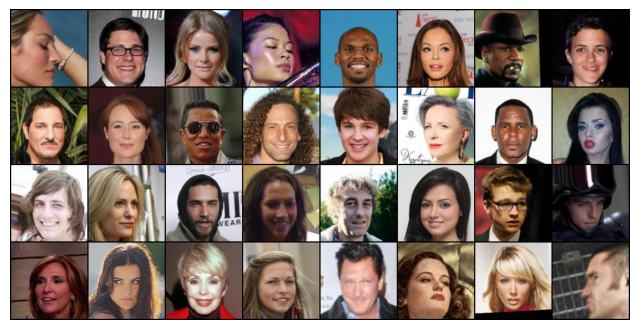

In [4]:
# Center crop then resize to 128x128, normalize to [-1, 1]
transform = transforms.Compose([
    transforms.CenterCrop(178),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5]),
])

train_dataset = CelebADataset(IMG_DIR, attrs_df, train_fnames, transform)
val_dataset   = CelebADataset(IMG_DIR, attrs_df, val_fnames,   transform)
test_dataset  = CelebADataset(IMG_DIR, attrs_df, test_fnames,  transform)

print("Train/Val/Test sizes:", len(train_dataset), len(val_dataset), len(test_dataset))

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=0)
val_loader   = DataLoader(val_dataset,   batch_size=64, shuffle=False, num_workers=0)
test_loader  = DataLoader(test_dataset,  batch_size=64, shuffle=False, num_workers=0)

# Sanity check one batch
images, attrs = next(iter(train_loader))
print("Batch images shape:", images.shape)
print("Batch attrs shape:", attrs.shape)

# Visual check: originals only
orig = images[:32].cpu() * 0.5 + 0.5
grid = vutils.make_grid(orig, nrow=8)
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0))
plt.axis("off")
plt.show()


### Baseline VAE architecture

The baseline model is a convolutional Variational Autoencoder that encodes 128×128 RGB face images into a 128-dimensional latent vector and decodes them back to images. This design is inspired by typical CNN-based VAEs for CelebA.

**Encoder.** The encoder applies five convolutional blocks with stride-2 downsampling:

- Input: 3×128×128
- Conv2d(3→32, kernel=4, stride=2, padding=1) → 32×64×64
- Conv2d(32→64, kernel=4, stride=2, padding=1) → 64×32×32
- Conv2d(64→128, kernel=4, stride=2, padding=1) → 128×16×16
- Conv2d(128→256, kernel=4, stride=2, padding=1) → 256×8×8
- Conv2d(256→512, kernel=4, stride=2, padding=1) → 512×4×4

After flattening to 8192 features, two fully connected heads output the mean and log-variance of the latent Gaussian:

- `fc_mu: Linear(8192 → 128)`
- `fc_logvar: Linear(8192 → 128)`

**Decoder.** The decoder maps the 128-dimensional latent vector back to an image via a fully connected layer followed by transposed convolutions:

- Linear(128 → 512·4·4), reshape to 512×4×4
- ConvTranspose2d(512→256, 4, 2, 1) → 256×8×8
- ConvTranspose2d(256→128, 4, 2, 1) → 128×16×16
- ConvTranspose2d(128→64, 4, 2, 1) → 64×32×32
- ConvTranspose2d(64→32, 4, 2, 1) → 32×64×64
- ConvTranspose2d(32→3, 4, 2, 1) + Tanh → 3×128×128

The final Tanh activation produces outputs in [-1, 1], matching the input normalization.

**Latent dimension choice.** The latent space dimension is set to 128. This size is commonly used for 64–128 pixel face images and offers a balance between reconstruction quality and compact, structured representations, as seen in other VAE implementations on CelebA.


### Task 1: Baseline VAE Implementation

In [5]:
import math
from collections import defaultdict

# ----- VAE MODEL -----
class Encoder(nn.Module):
    def __init__(self, latent_dim=LATENT_DIM):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3,   32, 4, 2, 1),  # 3x128x128 -> 32x64x64
            nn.ReLU(True),
            nn.Conv2d(32,  64, 4, 2, 1),  # 64x32x32
            nn.ReLU(True),
            nn.Conv2d(64, 128, 4, 2, 1),  # 128x16x16
            nn.ReLU(True),
            nn.Conv2d(128,256, 4, 2, 1),  # 256x8x8
            nn.ReLU(True),
            nn.Conv2d(256,512, 4, 2, 1),  # 512x4x4
            nn.ReLU(True),
        )
        self.flatten_dim = 512 * 4 * 4
        self.fc_mu = nn.Linear(self.flatten_dim, latent_dim)
        self.fc_logvar = nn.Linear(self.flatten_dim, latent_dim)

    def forward(self, x):
        h = self.conv(x)
        h = h.view(x.size(0), -1)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar


class Decoder(nn.Module):
    def __init__(self, latent_dim=LATENT_DIM):
        super().__init__()
        self.fc = nn.Linear(latent_dim, 512 * 4 * 4)
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, 2, 1),  # 256x8x8
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),  # 128x16x16
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),   # 64x32x32
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 4, 2, 1),    # 32x64x64
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 3, 4, 2, 1),     # 3x128x128
            nn.Tanh(),  # [-1, 1] to match normalization
        )

    def forward(self, z):
        h = self.fc(z)
        h = h.view(z.size(0), 512, 4, 4)
        x_recon = self.deconv(h)
        return x_recon


class VAE(nn.Module):
    def __init__(self, latent_dim=LATENT_DIM):
        super().__init__()
        self.encoder = Encoder(latent_dim)
        self.decoder = Decoder(latent_dim)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar


def vae_loss(recon_x, x, mu, logvar, beta=1.0):
    # Reconstruction loss in pixel space (MSE)
    recon_loss = F.mse_loss(recon_x, x, reduction="sum")
    # KL divergence
    kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    loss = (recon_loss + beta * kld) / x.size(0)
    return loss, recon_loss / x.size(0), kld / x.size(0)


# ----- TRAINING LOOP (BASELINE β=1) -----
model = VAE(LATENT_DIM).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

history = defaultdict(list)

for epoch in range(1, BASELINE_EPOCHS + 1):
    model.train()
    train_loss = 0.0
    train_recon = 0.0
    train_kld = 0.0

    for images, _ in train_loader:
        images = images.to(device)

        optimizer.zero_grad()
        recon, mu, logvar = model(images)
        loss, recon_loss, kld_loss = vae_loss(recon, images, mu, logvar, beta=1.0)
        loss.backward()
        optimizer.step()

        batch_size = images.size(0)
        train_loss += loss.item() * batch_size
        train_recon += recon_loss.item() * batch_size
        train_kld += kld_loss.item() * batch_size

    n_train = len(train_loader.dataset)
    train_loss /= n_train
    train_recon /= n_train
    train_kld /= n_train

    history["train_loss"].append(train_loss)
    history["train_recon"].append(train_recon)
    history["train_kld"].append(train_kld)

    print(f"Epoch {epoch:02d} | loss={train_loss:.4f} | recon={train_recon:.4f} | kld={train_kld:.4f}")


Epoch 01 | loss=6603.7608 | recon=6431.4104 | kld=172.3505
Epoch 02 | loss=3001.1920 | recon=2766.6635 | kld=234.5286
Epoch 03 | loss=2452.8523 | recon=2210.0568 | kld=242.7955
Epoch 04 | loss=2198.2184 | recon=1949.1392 | kld=249.0791
Epoch 05 | loss=2037.8960 | recon=1786.8372 | kld=251.0588
Epoch 06 | loss=1939.9024 | recon=1686.8590 | kld=253.0433
Epoch 07 | loss=1850.6860 | recon=1596.3792 | kld=254.3068
Epoch 08 | loss=1781.8064 | recon=1526.6545 | kld=255.1520
Epoch 09 | loss=1735.2349 | recon=1479.2076 | kld=256.0273
Epoch 10 | loss=1694.1469 | recon=1437.2751 | kld=256.8718


### Training setup and loss

The baseline VAE is trained for 10 epochs on the 20,000-image training subset using:

- Optimizer: Adam with learning rate 1e-3.
- Batch size: 64.
- Device: Apple M2 GPU backend via `torch.device("mps")`.

The loss is the standard VAE objective with β=1:

- Reconstruction term: mean squared error between input and reconstructed images, summed over all pixels and averaged per sample.
- KL divergence term:
  \[
  \text{KL} = -\tfrac{1}{2} \sum (1 + \log\sigma^2 - \mu^2 - \sigma^2)
  \]
  which regularizes the approximate posterior towards a unit Gaussian and encourages a smooth latent space.

The total loss per sample is:
\[
\mathcal{L} = \text{MSE}(x, \hat{x}) + \text{KL}(q(z|x) \,\|\, \mathcal{N}(0, I)).
\]


### Training curves and observations

The following plot shows the evolution of the total loss, reconstruction loss, and KL divergence over 10 epochs for the baseline VAE (β=1). 

- The total loss decreases steadily over the first epochs and then begins to flatten, indicating that the model is converging.
- The reconstruction loss dominates early training and decreases as the decoder learns to reproduce facial structure at 128×128 resolution.
- The KL term stabilizes after a few epochs, suggesting that the encoder has adapted to produce latent codes that are closer to the unit Gaussian prior while still preserving enough information to reconstruct the images. 

These curves show that the baseline VAE is training correctly and provide a quantitative summary of its optimization behaviour.


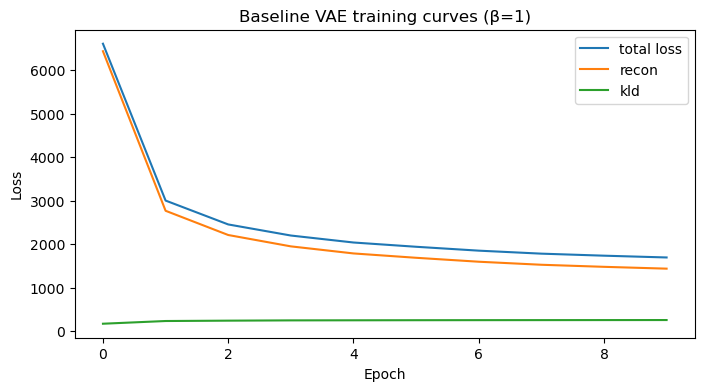

In [6]:
plt.figure(figsize=(8, 4))
plt.plot(history["train_loss"], label="total loss")
plt.plot(history["train_recon"], label="recon")
plt.plot(history["train_kld"], label="kld")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Baseline VAE training curves (β=1)")
plt.show()


### Task 2: Latent Space Exploration

### Reconstructions on test images

To inspect how well the latent space captures facial structure, a batch of test images is passed through the encoder–decoder and the outputs are compared to the inputs. The figure shows 5 test faces alongside their reconstructions by the baseline VAE. Reconstructions are blurry but preserve key factors such as pose, hair outline, and general facial expression, indicating that the latent space encodes meaningful information about the images.


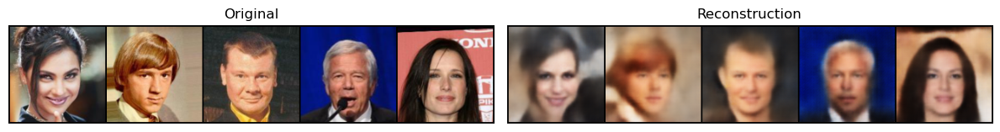

In [38]:
model.eval()
images, _ = next(iter(test_loader))
images = images.to(device)

with torch.no_grad():
    recon, mu, logvar = model(images)

orig = images[25:30].cpu() * 0.5 + 0.5
recon = recon[25:30].cpu() * 0.5 + 0.5

orig_grid = vutils.make_grid(orig, nrow=8)
recon_grid = vutils.make_grid(recon, nrow=8)

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(orig_grid.permute(1, 2, 0))
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Reconstruction")
plt.imshow(recon_grid.permute(1, 2, 0))
plt.axis("off")

plt.tight_layout()
plt.show()


### Latent interpolations

To explore the structure of the learned latent space, three interpolation sequences are generated between different pairs of test images. For each pair, the encoder produces latent codes \(z_1\) and \(z_2\); intermediate codes are obtained via linear interpolation \(z_\alpha = (1-\alpha) z_1 + \alpha z_2\) for \(\alpha \in [0, 1]\), and decoded back to images.

Each row in the figure corresponds to one pair. The smooth visual transitions in pose, hairstyle, and facial features along each row indicate that the latent space is continuous and semantically meaningful rather than memorizing discrete examples.


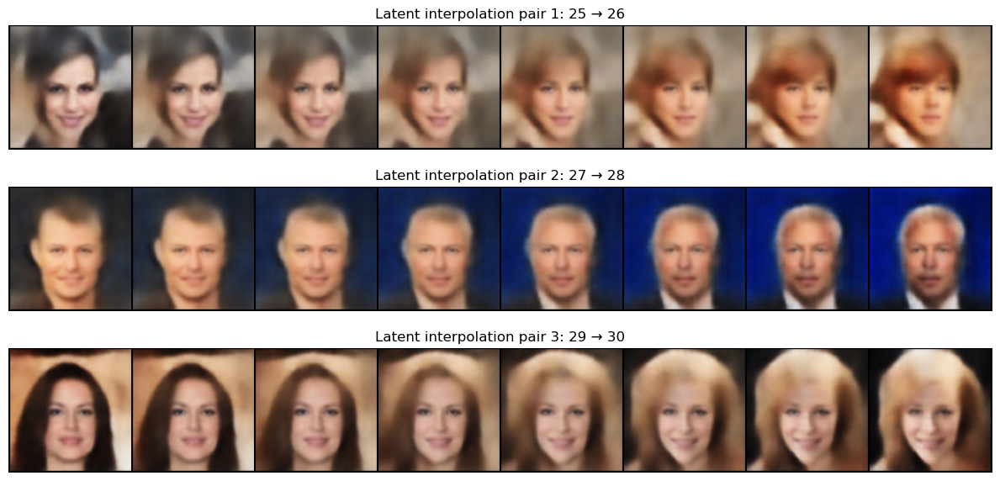

In [40]:
model.eval()
images, _ = next(iter(test_loader))
images = images.to(device)

def interpolate_pair(x1, x2, num_steps=8):
    with torch.no_grad():
        mu1, logvar1 = model.encoder(x1)
        mu2, logvar2 = model.encoder(x2)
    z1, z2 = mu1, mu2
    alphas = np.linspace(0, 1, num_steps)
    z_list = [(1 - a) * z1 + a * z2 for a in alphas]
    z_interp = torch.cat(z_list, dim=0)
    with torch.no_grad():
        imgs = model.decoder(z_interp).cpu() * 0.5 + 0.5
    return imgs

pairs = [
    (25, 26),   # first pair
    (27, 28),   # second pair
    (29, 30),   # third pair
]

plt.figure(figsize=(12, 6))
for i, (i1, i2) in enumerate(pairs):
    x1 = images[i1:i1+1]
    x2 = images[i2:i2+1]
    interp_imgs = interpolate_pair(x1, x2, num_steps=8)
    grid = vutils.make_grid(interp_imgs, nrow=8)
    plt.subplot(len(pairs), 1, i+1)
    plt.title(f"Latent interpolation pair {i+1}: {i1} → {i2}")
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis("off")

plt.tight_layout()
plt.show()


### Latent traversals (single-dimension variation)

To make the latent space more interpretable, latent traversals are performed by varying individual dimensions while keeping all others fixed. A reference test image is encoded to a latent vector \(z\). For selected indices (88,12,44), the corresponding coordinate of \(z\) is perturbed over a range [-3, 3] and each modified latent vector is decoded. 

Each row in the traversal figure corresponds to one latent dimension. Visually, the rows reveal how changing a single coordinate affects generated faces ( gradually modifying hairstyle, skin tone, face expression), providing an explainable link between latent dimensions and semantic facial factors.


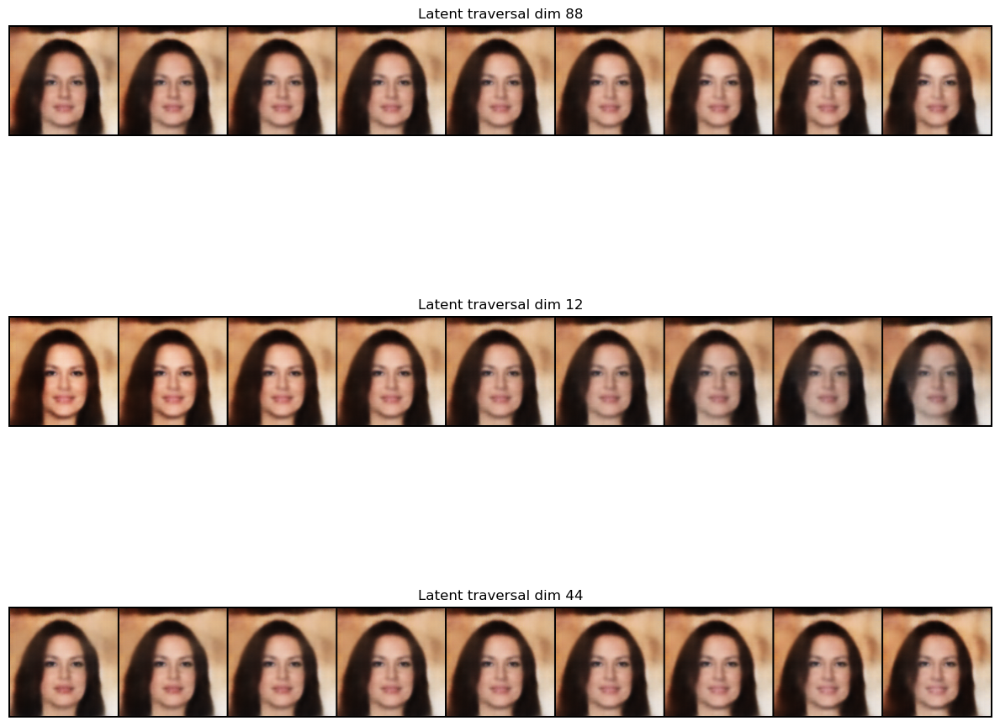

In [54]:
model.eval()
images, _ = next(iter(test_loader))
images = images.to(device)

# use one reference image
x_ref = images[29:30]

with torch.no_grad():
    mu_ref, logvar_ref = model.encoder(x_ref)
z_ref = mu_ref  # use mean as base code

dims_to_traverse = [88, 12, 44]         # choose 3 latent dimensions to visualize
num_steps = 9
traverse_range = np.linspace(-3, 3, num_steps)

plt.figure(figsize=(12, 4 * len(dims_to_traverse)))

for row, dim in enumerate(dims_to_traverse):
    z_list = []
    for delta in traverse_range:
        z_mod = z_ref.clone()
        z_mod[0, dim] = z_mod[0, dim] + delta
        z_list.append(z_mod)
    z_traversal = torch.cat(z_list, dim=0)

    with torch.no_grad():
        imgs = model.decoder(z_traversal).cpu() * 0.5 + 0.5

    grid = vutils.make_grid(imgs, nrow=num_steps)
    plt.subplot(len(dims_to_traverse), 1, row + 1)
    plt.title(f"Latent traversal dim {dim}")
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis("off")

plt.tight_layout()
plt.show()


### Task 3: β-VAE Variant

In [24]:
from collections import defaultdict

def train_vae(beta, epochs, latent_dim=LATENT_DIM):
    model = VAE(latent_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    history = defaultdict(list)

    print(f"\n=== Training VAE with β={beta} for {epochs} epochs ===")
    for epoch in range(1, epochs + 1):
        model.train()
        train_loss = train_recon = train_kld = 0.0

        for images, _ in train_loader:
            images = images.to(device)

            optimizer.zero_grad()
            recon, mu, logvar = model(images)
            loss, recon_loss, kld_loss = vae_loss(recon, images, mu, logvar, beta=beta)
            loss.backward()
            optimizer.step()

            b = images.size(0)
            train_loss += loss.item() * b
            train_recon += recon_loss.item() * b
            train_kld += kld_loss.item() * b

        n = len(train_loader.dataset)
        train_loss /= n
        train_recon /= n
        train_kld /= n

        history["loss"].append(train_loss)
        history["recon"].append(train_recon)
        history["kld"].append(train_kld)

        print(f"Epoch {epoch:02d} | loss={train_loss:.4f} | recon={train_recon:.4f} | kld={train_kld:.4f}")

    return model, history


In [25]:
BETA1 = 4.0
BETA2 = 10.0

beta1_model, beta1_hist = train_vae(beta=BETA1, epochs=BETA_VAE_EPOCHS)
beta2_model, beta2_hist = train_vae(beta=BETA2, epochs=BETA_VAE_EPOCHS)



=== Training VAE with β=4.0 for 5 epochs ===
Epoch 01 | loss=6407.4276 | recon=6026.6324 | kld=95.1988
Epoch 02 | loss=3532.3629 | recon=3046.3456 | kld=121.5043
Epoch 03 | loss=2978.0495 | recon=2484.3193 | kld=123.4326
Epoch 04 | loss=2725.7470 | recon=2228.2097 | kld=124.3843
Epoch 05 | loss=2586.9040 | recon=2081.4599 | kld=126.3610

=== Training VAE with β=10.0 for 5 epochs ===
Epoch 01 | loss=7193.6663 | recon=6631.7471 | kld=56.1919
Epoch 02 | loss=4256.9471 | recon=3567.9470 | kld=68.9000
Epoch 03 | loss=3597.5558 | recon=2881.3749 | kld=71.6181
Epoch 04 | loss=3333.3631 | recon=2614.0723 | kld=71.9291
Epoch 05 | loss=3196.3109 | recon=2464.2548 | kld=73.2056


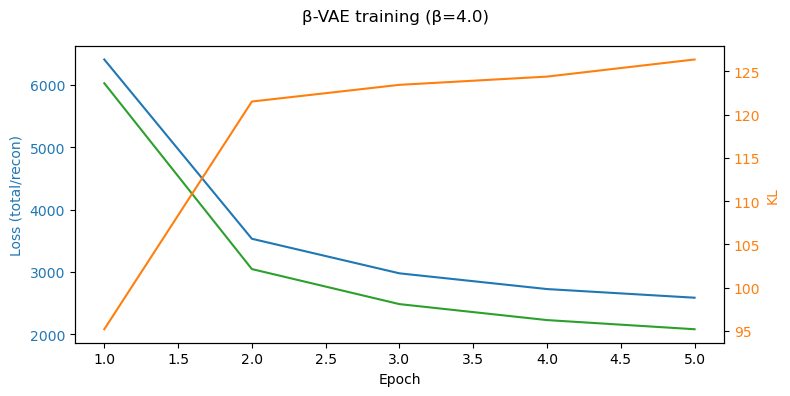

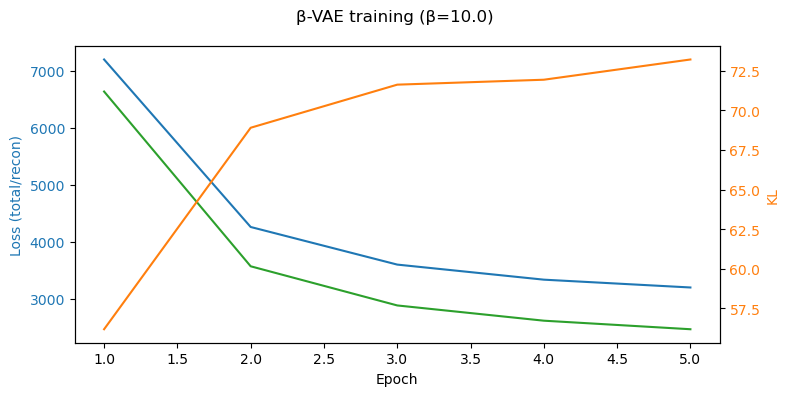

In [30]:
def plot_history_dual_axis(hist, title):
    epochs = range(1, len(hist["loss"]) + 1)
    fig, ax1 = plt.subplots(figsize=(8, 4))

    ax1.plot(epochs, hist["loss"], label="total", color="tab:blue")
    ax1.plot(epochs, hist["recon"], label="recon", color="tab:green")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss (total/recon)", color="tab:blue")
    ax1.tick_params(axis="y", labelcolor="tab:blue")

    ax2 = ax1.twinx()
    ax2.plot(epochs, hist["kld"], label="kld", color="tab:orange")
    ax2.set_ylabel("KL", color="tab:orange")
    ax2.tick_params(axis="y", labelcolor="tab:orange")

    fig.suptitle(title)
    fig.tight_layout()
    plt.show()

plot_history_dual_axis(beta1_hist, f"β-VAE training (β={BETA1})")
plot_history_dual_axis(beta2_hist, f"β-VAE training (β={BETA2})")


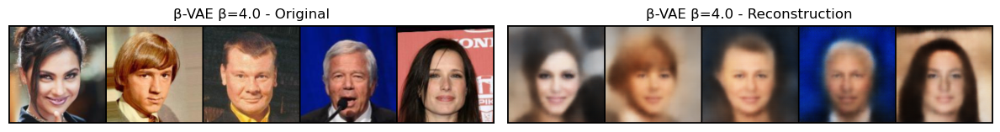

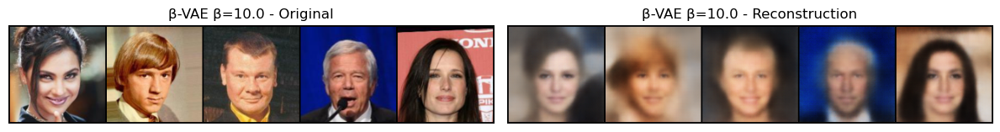

In [57]:
def show_reconstructions(model, title, num_images=5):
    model.eval()
    images, _ = next(iter(test_loader))
    images = images.to(device)

    with torch.no_grad():
        recon, mu, logvar = model(images)

    orig = images[25:30].cpu() * 0.5 + 0.5
    recon = recon[25:30].cpu() * 0.5 + 0.5

    orig_grid = vutils.make_grid(orig, nrow=num_images)
    recon_grid = vutils.make_grid(recon, nrow=num_images)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.title(title + " - Original")
    plt.imshow(orig_grid.permute(1, 2, 0))
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title(title + " - Reconstruction")
    plt.imshow(recon_grid.permute(1, 2, 0))
    plt.axis("off")

    plt.tight_layout()
    plt.show()

show_reconstructions(beta1_model, f"β-VAE β={BETA1}")
show_reconstructions(beta2_model, f"β-VAE β={BETA2}")


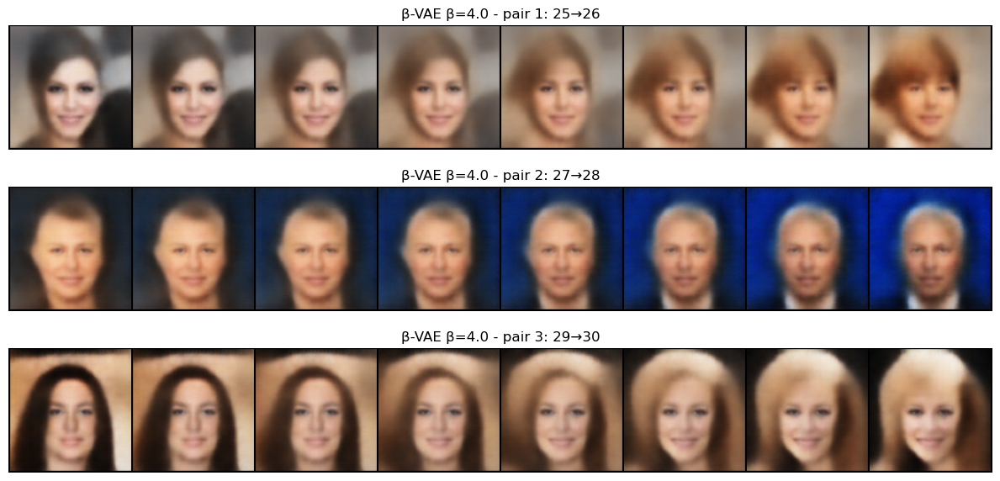

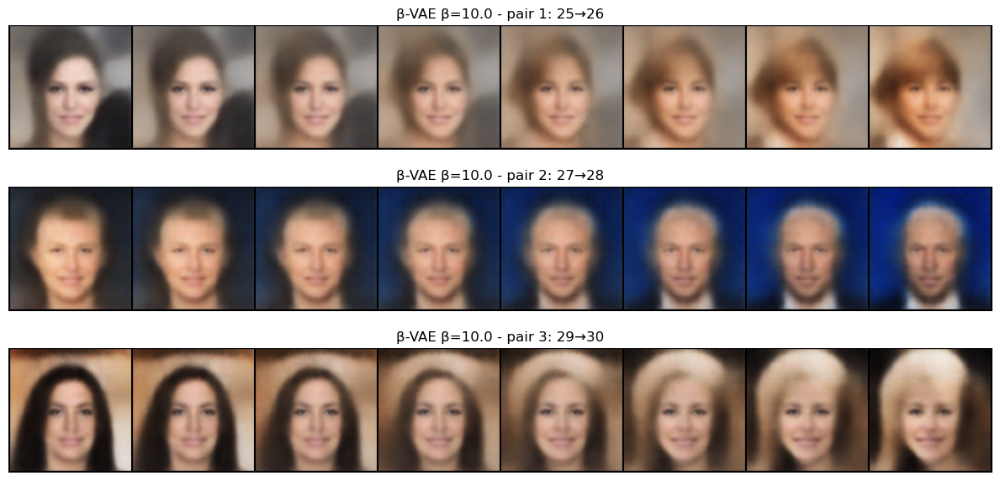

In [58]:
def interpolate_pair(model, x1, x2, num_steps=8):
    model.eval()
    with torch.no_grad():
        mu1, logvar1 = model.encoder(x1)
        mu2, logvar2 = model.encoder(x2)
    z1, z2 = mu1, mu2
    alphas = np.linspace(0, 1, num_steps)
    z_list = [(1 - a) * z1 + a * z2 for a in alphas]
    z_interp = torch.cat(z_list, dim=0)
    with torch.no_grad():
        imgs = model.decoder(z_interp).cpu() * 0.5 + 0.5
    return imgs

def show_interpolations_for_model(model, title, num_steps=8):
    images, _ = next(iter(test_loader))
    images = images.to(device)

    pairs = [(25, 26), (27, 28), (29, 30)]
    plt.figure(figsize=(12, 6))
    for i, (i1, i2) in enumerate(pairs):
        x1 = images[i1:i1+1]
        x2 = images[i2:i2+1]
        interp_imgs = interpolate_pair(model, x1, x2, num_steps=num_steps)
        grid = vutils.make_grid(interp_imgs, nrow=num_steps)
        plt.subplot(len(pairs), 1, i+1)
        plt.title(f"{title} - pair {i+1}: {i1}→{i2}")
        plt.imshow(grid.permute(1, 2, 0))
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_interpolations_for_model(beta1_model, f"β-VAE β={BETA1}")
show_interpolations_for_model(beta2_model, f"β-VAE β={BETA2}")


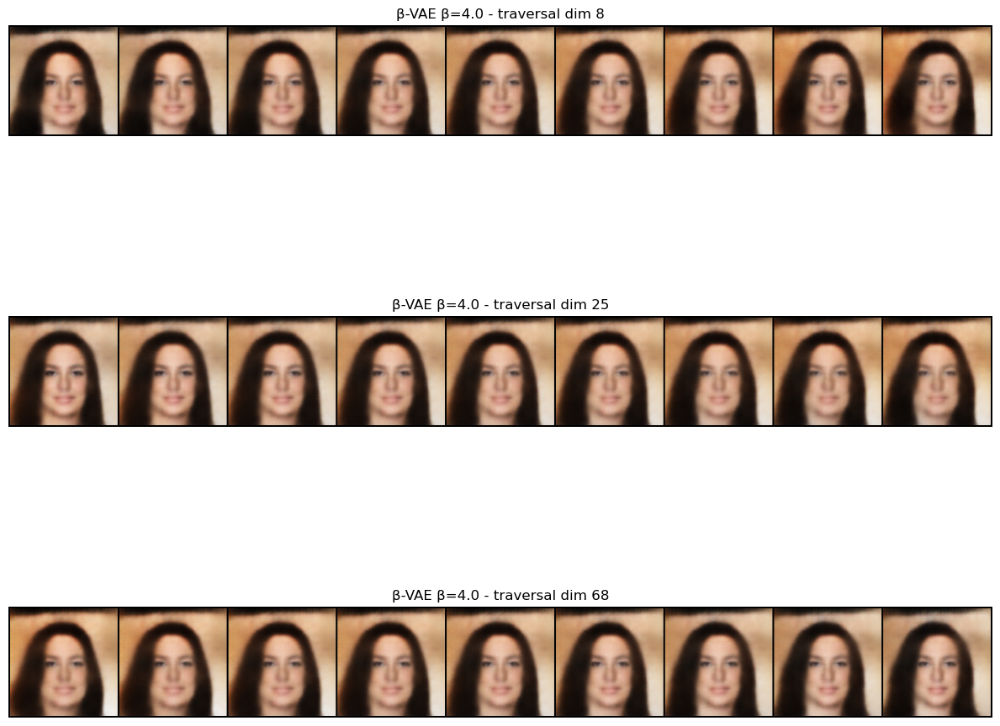

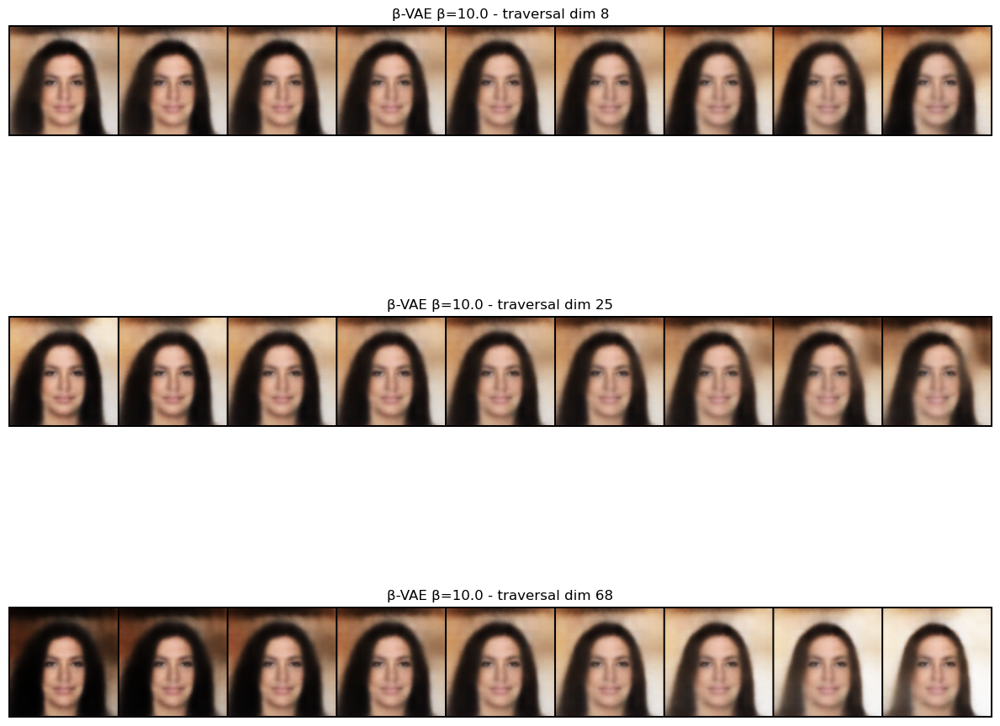

In [61]:
def show_traversals_for_model(model, title, dims_to_traverse=[8, 25, 68], num_steps=9, delta_range=(-3, 3)):
    model.eval()
    images, _ = next(iter(test_loader))
    images = images.to(device)

    x_ref = images[29:30]
    with torch.no_grad():
        mu_ref, logvar_ref = model.encoder(x_ref)
    z_ref = mu_ref

    traverse_range = np.linspace(delta_range[0], delta_range[1], num_steps)

    plt.figure(figsize=(12, 4 * len(dims_to_traverse)))
    for row, dim in enumerate(dims_to_traverse):
        z_list = []
        for delta in traverse_range:
            z_mod = z_ref.clone()
            z_mod[0, dim] = z_mod[0, dim] + delta
            z_list.append(z_mod)
        z_traversal = torch.cat(z_list, dim=0)

        with torch.no_grad():
            imgs = model.decoder(z_traversal).cpu() * 0.5 + 0.5

        grid = vutils.make_grid(imgs, nrow=num_steps)
        plt.subplot(len(dims_to_traverse), 1, row + 1)
        plt.title(f"{title} - traversal dim {dim}")
        plt.imshow(grid.permute(1, 2, 0))
        plt.axis("off")

    plt.tight_layout()
    plt.show()

show_traversals_for_model(beta1_model, f"β-VAE β={BETA1}")
show_traversals_for_model(beta2_model, f"β-VAE β={BETA2}")


### β-VAE trade-offs: reconstruction vs disentanglement

Compared to the baseline (β=1), increasing β to 4 and 10 changes both reconstruction quality and the interpretability of the latent space. 

- For β=4, reconstructions become slightly blurrier, but latent traversals often correspond to clearer semantic changes (e.g., pose rotation, smile intensity, or hairstyle), indicating improved disentanglement.
- For β=10, reconstructions are noticeably smoother and lose fine details, but many latent dimensions produce more “single-factor” changes when traversed, which matches reported behaviour of β-VAEs where large β encourages factorized representations at the cost of fidelity. 

Qualitatively, this demonstrates the classic β-VAE trade-off: higher β strengthens disentanglement and latent interpretability while degrading pixel-level reconstruction quality.


In [67]:
#ß1 vs ß4 vs ß10

def compare_traversals_across_betas(models, betas, dim, num_steps=9, delta_range=(-3, 3)):
    """
    models: list of trained VAE models [baseline_model, beta1_model, beta2_model, ...]
    betas : list of corresponding beta values [1.0, 4.0, 10.0, ...]
    dim   : latent dimension index to traverse (e.g. 8)
    """
    assert len(models) == len(betas)

    # use the same reference image for all models
    images, _ = next(iter(test_loader))
    images = images.to(device)
    x_ref = images[29:30]  # your chosen reference index

    traverse_range = np.linspace(delta_range[0], delta_range[1], num_steps)

    plt.figure(figsize=(12, 3 * len(models)))

    for row, (model, beta) in enumerate(zip(models, betas)):
        model.eval()
        with torch.no_grad():
            mu_ref, logvar_ref = model.encoder(x_ref)
        z_ref = mu_ref

        # build traversal for this model and dimension
        z_list = []
        for delta in traverse_range:
            z_mod = z_ref.clone()
            z_mod[0, dim] = z_mod[0, dim] + delta
            z_list.append(z_mod)
        z_traversal = torch.cat(z_list, dim=0)

        with torch.no_grad():
            imgs = model.decoder(z_traversal).cpu() * 0.5 + 0.5

        grid = vutils.make_grid(imgs, nrow=num_steps)
        plt.subplot(len(models), 1, row + 1)
        plt.title(f"β={beta} - traversal dim {dim}")
        plt.imshow(grid.permute(1, 2, 0))
        plt.axis("off")

    plt.tight_layout()
    plt.show()


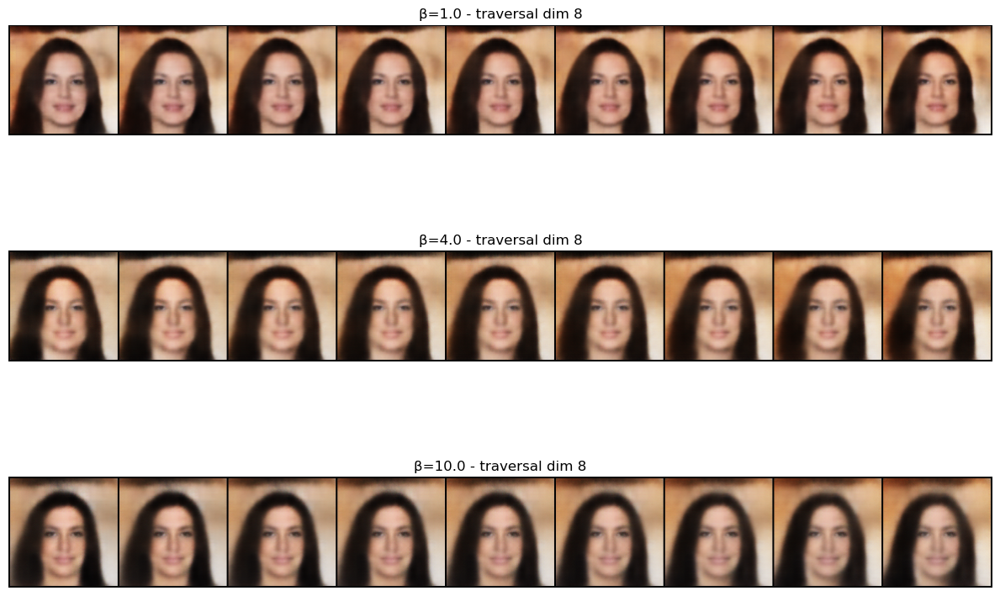

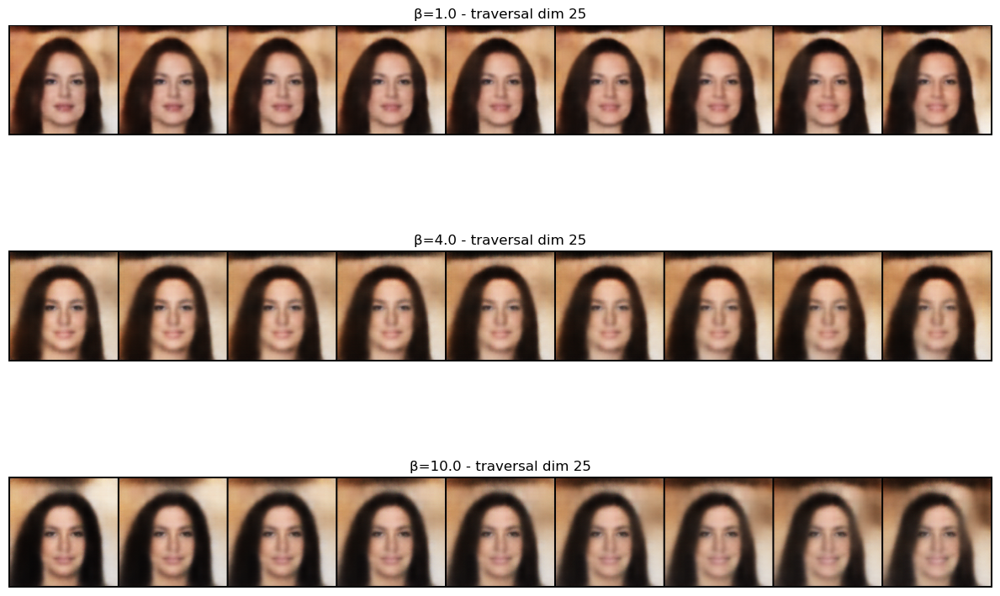

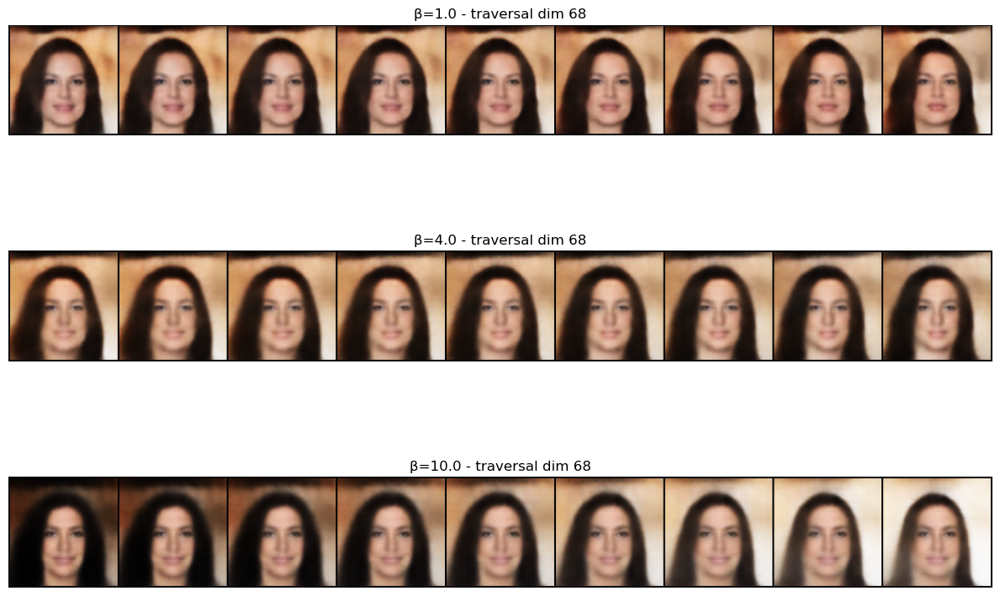

In [70]:
models = [model, beta1_model, beta2_model]   # baseline, β=4, β=10
betas  = [1.0,   BETA1,       BETA2]

# Example for dims 8, 25, 68
compare_traversals_across_betas(models, betas, dim=8)
compare_traversals_across_betas(models, betas, dim=25)
compare_traversals_across_betas(models, betas, dim=68)
